In [1]:
# Loading packages
import sys
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import os
import squidpy as sq
import time
import random

data_type = 'float32'
os.environ["THEANO_FLAGS"] = 'device=cuda,floatX=float32,force_device=True'
import scvi
import cell2location
from cell2location import run_regression

import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sns
import tangram as tg
from cellpose import models
import skimage

# silence scanpy that prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

#sid = int(os.getenv('SLURM_ARRAY_TASK_ID')) - 1


<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
Global seed set to 0
ERROR (theano.gpuarray): pygpu was configured but could not be imported or is too old (version 0.7 or higher required)
NoneType: None
2022-06-21 17:28:31.326277: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /edgehpc/apps/sp/linux-centos7-x86_64/gcc-4.8.5/gcc-11.1.0-jxbykdjc57qtdxyci3o5wq75p3odpthq/lib64:/edgehpc/apps/sp/linux-centos7-x86_64/gcc-4.8.5/gcc-11.1.0-jxbykdjc57qtdxyci3o5wq75p3odpthq/lib:/cm/shared/apps/slurm/current/lib64/slurm:/cm/shared/apps/slurm/current/lib64::
2022-06-21 17:28:31.326315: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU 

In [5]:
# Loading snRNAseq reference data

sample_id = '075B' #id for specific mouse brain capture
number_id = '14'  # mouse id


In [3]:
sc_data_folder = "/home/wwang11/cuprizone/data-raw/snRNAseq/cuprizonemouse_brain_alllevels_comb_clean_splitsamples/"
results_folder = "/home/wwang11/cuprizone/tangram_out/"+str(sample_id)
if os.path.exists(results_folder) is not True:
    os.mkdir(results_folder)

In [6]:
#load single cell reference data
adata_snrna_raw = anndata.read_h5ad(sc_data_folder + "mouse_" + number_id + ".h5ad")
adata_snrna_raw

AnnData object with n_obs × n_vars = 36653 × 31040
    obs: 'Sample_ID', 'ID', 'Number', 'Study#', 'Group', 'Region', 'Day', 'Ultra', 'intronic_reads', 'exonic_reads', 'intronic_mapped_rate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'percent_mito', 'n_counts', 'louvain', 'celltype1', 'celltype2', 'celltype6', 'celltype4', 'celltypecl', 'celltypecl_class', 'celltypecl_subclass', 'celltype_up01', 'celltype_up02', 'celltype_up03', 'celltype_up04', 'celltype_up05'
    var: 'gene_ids-2G-2', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'celltype2_colors', 'celltype6_colors', 'celltype_up05_colors', 'celltypecl_class_colors', 'celltypecl_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap', 'X_umap_celltype4', 'X_u

In [7]:
##preprocessing on single nucleus reference data

X = adata_snrna_raw.raw.X
adata_ref = anndata.AnnData(X, obs=adata_snrna_raw.obs, var=adata_snrna_raw.var, dtype='int32')
#rename gene_ids-2G-2' to'gene_ids'
adata_ref.var.rename(columns = {'gene_ids-2G-2':'gene_ids'}, inplace = True)

# Use ENSEMBL as gene IDs to make sure IDs are unique and correctly matched
adata_ref.raw = adata_ref
adata_ref.var['SYMBOL'] = adata_ref.var.index
adata_ref.var.index = adata_ref.var['gene_ids'].copy()
adata_ref.var_names = adata_ref.var['gene_ids'].copy()
adata_ref.var.index.name = None
adata_ref.raw.var['SYMBOL'] = adata_ref.raw.var.index
adata_ref.raw.var.index = adata_ref.raw.var['gene_ids'].copy()
adata_ref.raw.var.index.name = None

# remove cells and genes with 0 counts everywhere
# remove cells and genes with 0 counts everywhere
sc.pp.filter_cells(adata_ref, min_genes=1)
sc.pp.filter_genes(adata_ref, min_cells=1)

adata_ref


AnnData object with n_obs × n_vars = 36653 × 27447
    obs: 'Sample_ID', 'ID', 'Number', 'Study#', 'Group', 'Region', 'Day', 'Ultra', 'intronic_reads', 'exonic_reads', 'intronic_mapped_rate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'percent_mito', 'n_counts', 'louvain', 'celltype1', 'celltype2', 'celltype6', 'celltype4', 'celltypecl', 'celltypecl_class', 'celltypecl_subclass', 'celltype_up01', 'celltype_up02', 'celltype_up03', 'celltype_up04', 'celltype_up05', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'SYMBOL', 'n_cells'

In [9]:
#remove cell types have only 1 cell

freqs = adata_ref.obs["celltypecl"].value_counts()
freq_keep = freqs.index[freqs >= 2]
i = 0
filter_data = [False] * len(adata_ref.obs["celltypecl"])
for celltypei in adata_ref.obs["celltypecl"]:
    filter_data[i] = celltypei in freq_keep
    i=i+1
adata_ref = adata_ref[filter_data,:]


In [11]:
#load spatial data
# Set paths to data and results used through the document:
sp_data_folder = '/home/wwang11/cuprizone/data-raw/'

def read_and_qc(sample_name, path=sp_data_folder): #+ 'rawdata/'):
    r""" This function reads the data for one 10X spatial experiment into the anndata object.
    It also calculates QC metrics. Modify this function if required by your workflow.

    :param sample_name: Name of the sample
    :param path: path to data
    """

    adata = sc.read_visium(path + str(sample_name),
                           count_file='filtered_feature_bc_matrix.h5', load_images=True)
    adata.obs['sample'] = sample_name
    adata.var['SYMBOL'] = adata.var_names
    #adata.var.rename(columns={'gene_ids': 'ENSEMBL'}, inplace=True)
    #adata.var_names = adata.var['ENSEMBL']
    #adata.var.drop(columns='ENSEMBL', inplace=True)

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var['SYMBOL']]
    adata.obs['mt_frac'] = adata[:, adata.var['mt'].tolist()].X.sum(1).A.squeeze()/adata.obs['total_counts']

    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs['sample']]
    adata.obs_names = adata.obs["sample"] \
                          + '_' + adata.obs_names
    adata.obs.index.name = 'spot_id'

    return adata


In [12]:
adata = read_and_qc(sample_id, path=sp_data_folder)
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 2312 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt'
    uns: 'spatial'
    obsm: 'spatial'

In [14]:
##Preprocessing on spatial data

adata.obsm['mt'] = adata[:, adata.var['mt'].values].X.toarray()
adata = adata[:, ~adata.var['mt'].values]
adata.raw = adata

# Use ENSEMBL as gene IDs to make sure IDs are unique and correctly matched

adata.var['SYMBOL'] = adata.var.index
adata.var.index = adata.var['gene_ids'].copy()
adata.var_names = adata.var['gene_ids'].copy()
adata.var.index.name = None
adata.raw.var['SYMBOL'] = adata.raw.var.index
adata.raw.var.index = adata.raw.var['gene_ids'].copy()
adata.raw.var.index.name = None


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [15]:
###Fine the intersection of genes between single nucleus dataset and spatial dataset
intersect = np.intersect1d(adata.var_names, adata_ref.var_names)
ad_sp = adata[:, intersect].copy()
ad_sc = adata_ref[:,intersect].copy()

In [16]:
ad_sp

AnnData object with n_obs × n_vars = 2312 × 26877
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt'
    uns: 'spatial'
    obsm: 'spatial', 'mt'

In [17]:
ad_sc

AnnData object with n_obs × n_vars = 36653 × 26877
    obs: 'Sample_ID', 'ID', 'Number', 'Study#', 'Group', 'Region', 'Day', 'Ultra', 'intronic_reads', 'exonic_reads', 'intronic_mapped_rate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'percent_mito', 'n_counts', 'louvain', 'celltype1', 'celltype2', 'celltype6', 'celltype4', 'celltypecl', 'celltypecl_class', 'celltypecl_subclass', 'celltype_up01', 'celltype_up02', 'celltype_up03', 'celltype_up04', 'celltype_up05', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'SYMBOL', 'n_cells'

In [19]:
#save image to ImageContainer
key=list(ad_sp.uns['spatial'].keys())[0]
img = sq.im.ImageContainer(ad_sp.uns['spatial'][str(key)]['images']['hires'], layer="image")
img

ImageContainer[shape=(2000, 1923), layers=['image']]

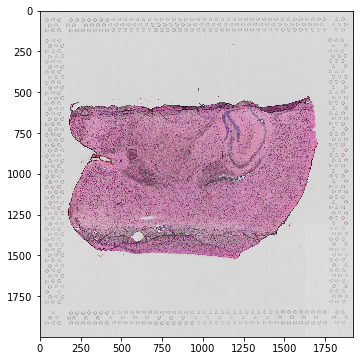

In [20]:
fig, axs = plt.subplots(1, 1, figsize=(6, 6))
axs.imshow(
    img["image"][:,: , 0, :3],
    interpolation="none",
)

[<AxesSubplot:title={'center':'sample'}, xlabel='spatial1', ylabel='spatial2'>]

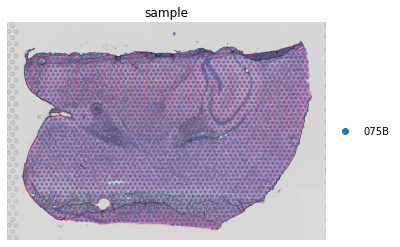

In [21]:
sf=ad_sp.uns['spatial'][str(key)]['scalefactors']['tissue_hires_scalef']

sc.pl.spatial(
    ad_sp, color="sample", alpha=0.7, frameon=False, show=False, scale_factor=sf
)

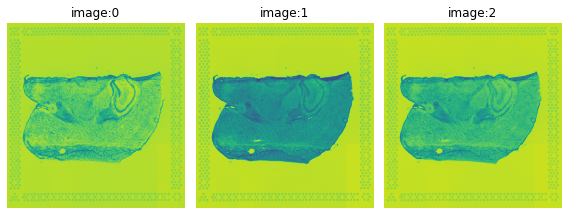

In [22]:
sq.im.process(img=img, layer="image", method="smooth")
img.show("image", channelwise=True)

In [23]:
##check the cell segmentation results on a crop of the image first
crop = img.crop_corner(1000, 450, size=300)
crop

ImageContainer[shape=(300, 300), layers=['image', 'image_smooth']]

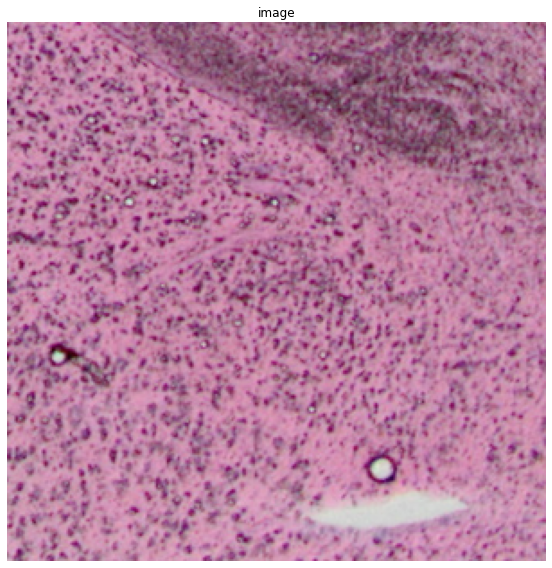

In [24]:
crop.show("image")

In [25]:

start_time=time.time()
sq.im.segment(img=crop, layer="image_smooth", method="watershed", geq=False)

print("execution_time: ",time.time()-start_time)


execution_time:  0.1039578914642334


In [26]:
#binarize the segmentation results for better visualizations
seg_binary=np.array(crop['segmented_watershed'])
crop.add_img(np.multiply((seg_binary>0), 1), layer="segmented_binary")


ImageContainer[shape=(300, 300), layers=['image', 'image_smooth', 'segmented_binary', 'segmented_watershed']]
Number of segments in crop: 938


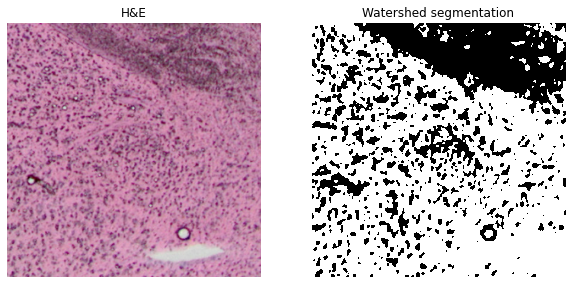

In [27]:
##Here nucleus are highlighted by color black
print(crop)
print(f"Number of segments in crop: {len(np.unique(crop['segmented_watershed']))}")

fig, axes = plt.subplots(1, 2, figsize=(10, 20))
crop.show("image", channel=None, ax=axes[0])
_ = axes[0].set_title("H&E")
crop.show("segmented_binary", cmap="binary",interpolation='none', ax=axes[1])
_ = axes[1].set_title("Watershed segmentation")


ImageContainer[shape=(300, 300), layers=['image', 'image_smooth', 'segmented_binary', 'segmented_watershed']]
Number of segments in crop: 938


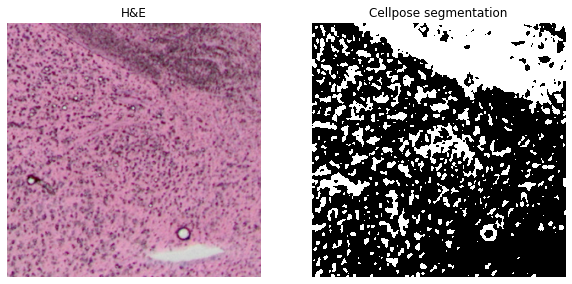

In [28]:
##Here nucleus are highlighted by color white

print(crop)
print(f"Number of segments in crop: {len(np.unique(crop['segmented_watershed']))}")

fig, axes = plt.subplots(1, 2, figsize=(10, 20))
crop.show("image", channel=None, ax=axes[0])
_ = axes[0].set_title("H&E")
crop.show("segmented_binary", cmap="gray",interpolation='none', ax=axes[1])
_ = axes[1].set_title("Cellpose segmentation")


In [29]:
#Now start to segment on the all image

start_time=time.time()
sq.im.segment(img=img, layer="image_smooth", method="watershed", geq=False)
print("execution_time: ",time.time()-start_time)


execution_time:  28.470115184783936


In [30]:
print(f"Number of segments in img: {len(np.unique(img['segmented_watershed']))}")
seg_binary=np.array(img['segmented_watershed'])
img.add_img(np.multiply((seg_binary>0), 1), layer="segmented_binary")


Number of segments in img: 22724


(2000, 1923, 1)


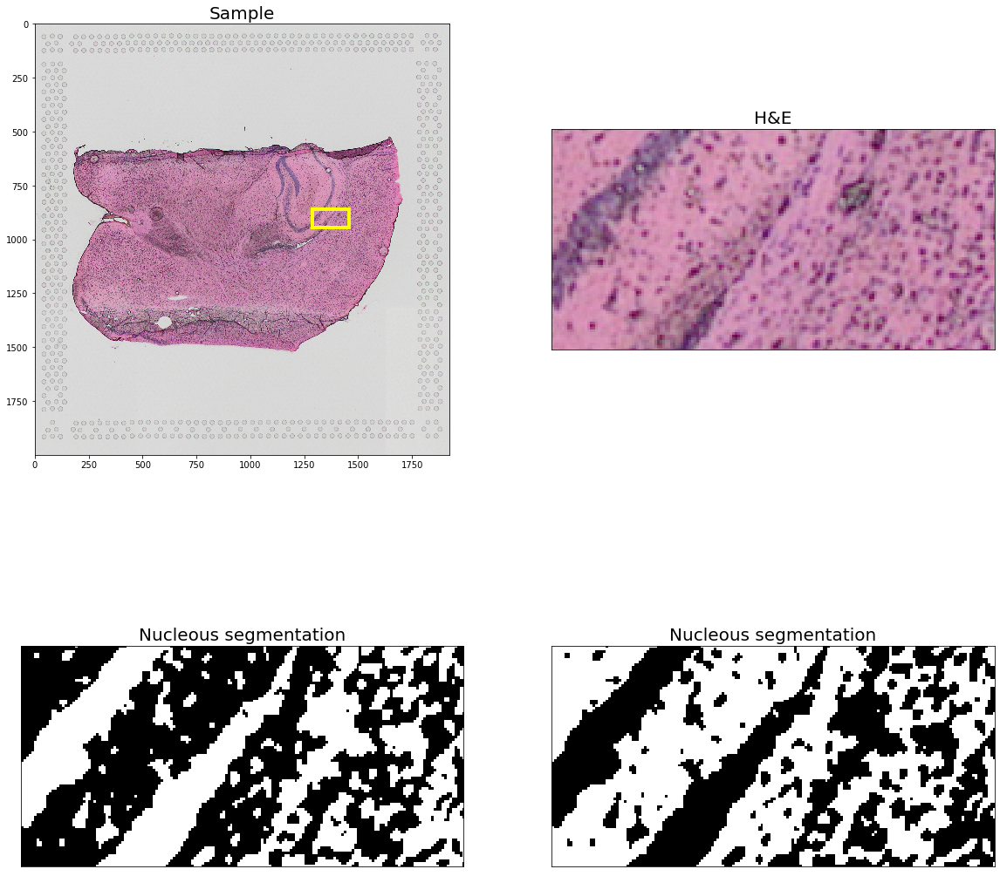

In [31]:
inset_x = 1000
inset_sx = 200
inset_y = 1500
inset_sy = 100
#inset_sx = 100
#inset_sy = 80

fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs[0,0].imshow(
    img["image"][:,: , 0, :3],
    interpolation="none",
)
axs[0,0].set_title("Sample", fontdict={"fontsize": 20})
sf = ad_sp.uns['spatial'][str(key)]['scalefactors']['tissue_hires_scalef']

rect = mpl.patches.Rectangle(
    (inset_y * sf, inset_x * sf),
    width=inset_sx * sf,
    height=inset_sy * sf,
    ec="yellow",
    lw=4,
    fill=False,
)
axs[0,0].add_patch(rect)

axs[0,0].axes.xaxis.label.set_visible(False)
axs[0,0].axes.yaxis.label.set_visible(False)

axs[0,1].imshow(
    img["image"][:,: , 0, :3],
    interpolation="none",
)
axs[0,1].set_xlim(inset_y*sf, (inset_y+inset_sx)*sf)
axs[0,1].set_ylim((inset_x+inset_sy)*sf,inset_x*sf )


axs[0,1].grid(False)
axs[0,1].set_xticks([])
axs[0,1].set_yticks([])
axs[0,1].set_title("H&E", fontdict={"fontsize": 20})


#crop = img["segmented_watershed"].values.squeeze(-1)
crop = img["segmented_binary"].values.squeeze(-1)
crop = skimage.segmentation.relabel_sequential(crop)[0]

print(crop.shape)

pcm=axs[1,0].imshow(crop, interpolation="none", cmap="gray", vmin=0.001)
axs[1,0].grid(False)
axs[1,0].set_xticks([])
axs[1,0].set_yticks([])
axs[1,0].set_xlim(inset_y*sf, (inset_y+inset_sx)*sf)
axs[1,0].set_ylim((inset_x+inset_sy)*sf,inset_x*sf )

axs[1,0].set_title("Nucleous segmentation", fontdict={"fontsize": 20});



pcm=axs[1,1].imshow(crop, interpolation="none", cmap="binary", vmin=0.001)
axs[1,1].grid(False)
axs[1,1].set_xticks([])
axs[1,1].set_yticks([])
axs[1,1].set_xlim(inset_y*sf, (inset_y+inset_sx)*sf)
axs[1,1].set_ylim((inset_x+inset_sy)*sf,inset_x*sf )

axs[1,1].set_title("Nucleous segmentation", fontdict={"fontsize": 20});
#fig.colorbar(pcm, ax=axs[1,1],shrink=0.6)

In [32]:
#To fit the spatial coordinates with H&E image, we have to adjust the spatial coordinates based on the scalefactor
ad_sp.obsm['spatial']=ad_sp.obsm['spatial']*sf

In [33]:
# define image layer to use for segmentation
features_kwargs = {
    "segmentation": {
        "label_layer": "segmented_watershed",
        "props": ["label", "centroid"],
        "channels": [0,1, 2],
    }
}

# calculate segmentation features
sq.im.calculate_image_features(
    ad_sp,
    img,
    layer="image",
    key_added="image_features",
    features_kwargs=features_kwargs,
    features="segmentation",
    mask_circle=True)


  0%|          | 0/2312 [00:00<?, ?/s]

In [34]:
ad_sp.obs["cell_count"] = ad_sp.obsm["image_features"]["segmentation_label"]


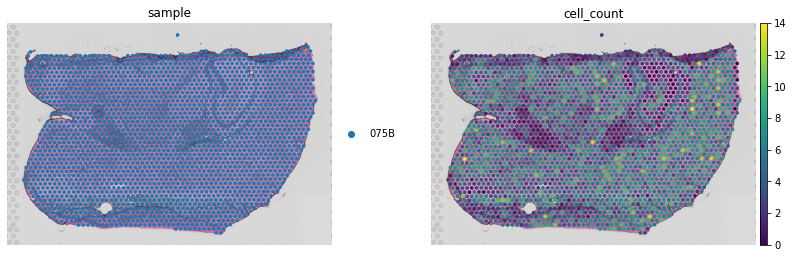

In [35]:
sc.pl.spatial(ad_sp, color=["sample", "cell_count"],
             # crop_coord=[inset_y, (inset_y + inset_sx),inset_x, (inset_x + inset_sy) ] ,
             # crop_coord=[inset_y, (inset_y + 100),inset_x, (inset_x + 80) ] ,
              frameon=False,scale_factor=1)


In [36]:
##Lognormalize the single nucleus data
ad_sc.layers['raw']=ad_sc.X
ad_sc.layers['normalized']=sc.pp.normalize_total(ad_sc,inplace=False)['X']
ad_sc.layers['log_norm']=sc.pp.log1p(ad_sc.layers['normalized'],copy=True)
print(np.max(ad_sc.layers['log_norm']))
print(np.min(ad_sc.layers['log_norm']))

7.895753
0.0


In [37]:
#extract marker genes as training genes

sc.tl.rank_genes_groups(ad_sc, groupby="celltypecl",layer='log_norm',use_raw=False)
markers_df_log = pd.DataFrame(ad_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]

markers_log = list(np.unique(markers_df_log.melt().value.values))

tg.pp_adatas(ad_sc, ad_sp, genes=markers_log)


INFO:root:1663 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:19193 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [38]:
 assert ad_sc.uns['training_genes'] == ad_sp.uns['training_genes']

In [39]:
ad_map = tg.map_cells_to_space(
    ad_sc,
    ad_sp,
    mode="constrained",
    target_count=ad_sp.obs.cell_count.sum(),
    density_prior=np.array(ad_sp.obs.cell_count) / ad_sp.obs.cell_count.sum(),
    num_epochs=1000,
     device="cuda:0"
  #  device='cpu',
)

INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1663 genes and customized density_prior in constrained mode...


Score: 0.376, KL reg: 0.109, Count reg: 5836.133, Lambda f reg: 7557.615
Score: 0.598, KL reg: 0.009, Count reg: 7.803, Lambda f reg: 1157.075
Score: 0.607, KL reg: 0.008, Count reg: 2.143, Lambda f reg: 318.086
Score: 0.609, KL reg: 0.008, Count reg: 0.892, Lambda f reg: 200.702
Score: 0.609, KL reg: 0.008, Count reg: 0.674, Lambda f reg: 157.815
Score: 0.610, KL reg: 0.008, Count reg: 0.002, Lambda f reg: 137.157
Score: 0.610, KL reg: 0.008, Count reg: 0.945, Lambda f reg: 123.926
Score: 0.610, KL reg: 0.008, Count reg: 0.037, Lambda f reg: 118.601
Score: 0.610, KL reg: 0.008, Count reg: 1.178, Lambda f reg: 108.063
Score: 0.610, KL reg: 0.008, Count reg: 0.356, Lambda f reg: 99.588


INFO:root:Saving results..


INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


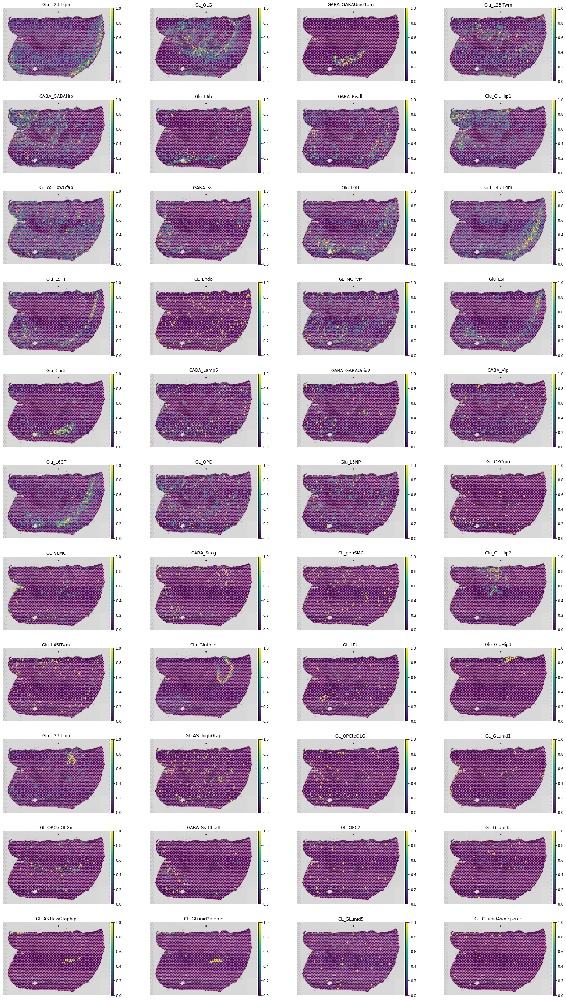

In [44]:
tg.project_cell_annotations(ad_map, ad_sp, annotation="celltypecl")
annotation_list = list(pd.unique(ad_sc.obs['celltypecl']))
tg.plot_cell_annotation_sc(ad_sp, annotation_list,perc=0.008,scale_factor=1)

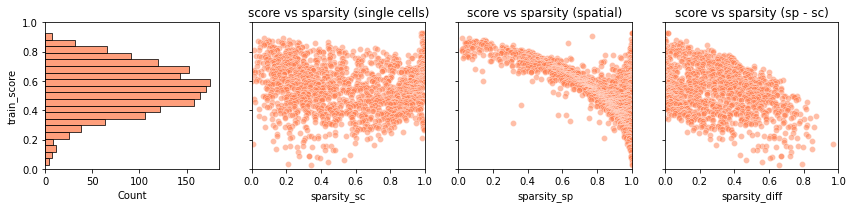

In [45]:
tg.plot_training_scores(ad_map, bins=20, alpha=.5)

In [46]:
#Projection on gene expressions
ad_ge = tg.project_genes(adata_map=ad_map, adata_sc=ad_sc)
ad_ge

AnnData object with n_obs × n_vars = 2312 × 26877
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'cell_count', 'uniform_density', 'rna_count_based_density'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'SYMBOL', 'n_cells', 'sparsity', 'is_training'
    uns: 'rank_genes_groups', 'training_genes', 'overlap_genes'

In [47]:
df_all_genes = tg.compare_spatial_geneexp(ad_ge, ad_sp, ad_sc)
df_all_genes.head(3)

,score,is_training,sparsity_sp,sparsity_sc,sparsity_diff
ensmusg00000115432,0.927551,True,0.998702,0.978828,0.019874
ensmusg00000104301,0.926903,True,0.999567,0.991924,0.007643
ensmusg00000042351,0.924504,True,0.999567,0.983849,0.015719


<Figure size 432x288 with 0 Axes>

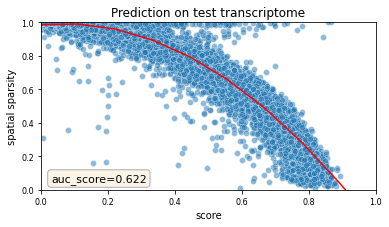

In [48]:
tg.plot_auc(df_all_genes);

In [49]:
tg.create_segment_cell_df(ad_sp)
ad_sp.uns["tangram_cell_segmentation"].head()
#each row is a cell

,spot_idx,y,x,centroids
0,075B_AAACAAGTATCTCCCA-1,1429.023027,1224.000000,075B_AAACAAGTATCTCCCA-1_0
1,075B_AAACAAGTATCTCCCA-1,1423.000000,1236.738219,075B_AAACAAGTATCTCCCA-1_1
2,075B_AAACAAGTATCTCCCA-1,1430.397849,1241.022893,075B_AAACAAGTATCTCCCA-1_2
3,075B_AAACAAGTATCTCCCA-1,1442.000000,1243.000000,075B_AAACAAGTATCTCCCA-1_3
4,075B_AAACACCAATAACTGC-1,398.000000,1440.000000,075B_AAACACCAATAACTGC-1_0


In [50]:
#Deconvolution on cell types for each spot

tg.count_cell_annotations(
    ad_map,
    ad_sc,
    ad_sp,
    annotation="celltypecl",
)
ad_sp.obsm["tangram_ct_count"].head(3)

,x,y,cell_n,centroids,Glu_L23ITgm,GL_OLG,GABA_GABAUnid1gm,Glu_L23ITwm,GABA_GABAHip,Glu_L6b,...,GL_OPCtoOLGi,GL_GLunid1,GL_OPCtoOLGii,GABA_SstChodl,GL_OPC2,GL_GLunid3,GL_ASTlowGfaphip,GL_GLunid2hiprec,GL_GLunid5,GL_GLunid4wmcpzrec
075B_AAACAAGTATCTCCCA-1,1233.476397,1432.618028,4,"[075B_AAACAAGTATCTCCCA-1_0, 075B_AAACAAGTATCTC...",2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
075B_AAACACCAATAACTGC-1,1430.042921,407.725323,2,"[075B_AAACACCAATAACTGC-1_0, 075B_AAACACCAATAAC...",5,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
075B_AAACAGCTTTCAGAAG-1,1086.695281,283.261803,7,"[075B_AAACAGCTTTCAGAAG-1_0, 075B_AAACAGCTTTCAG...",2,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
adata_segment = tg.deconvolve_cell_annotations(ad_sp)
adata_segment.obs.head(3)

,y,x,centroids,cluster
0,1429.023027,1224.000000,075B_AAACAAGTATCTCCCA-1_0,Glu_L23ITgm
1,1423.000000,1236.738219,075B_AAACAAGTATCTCCCA-1_1,Glu_L23ITgm
2,1430.397849,1241.022893,075B_AAACAAGTATCTCCCA-1_2,Glu_L6IT


[<AxesSubplot:title={'center':'cluster'}, xlabel='spatial1', ylabel='spatial2'>]

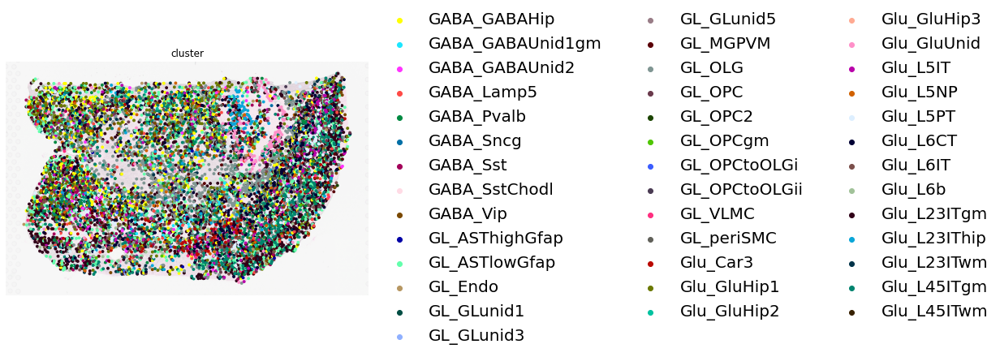

In [53]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
sc.pl.spatial(
    adata_segment,
    color="cluster",
    size=0.8,
    show=False,
    frameon=False,
    alpha_img=0.2,
    legend_fontsize=20,
    ax=ax,
    scale_factor=1
)



In [52]:
##This is where we start as an extension of Tangram tutorial 
##to extract specific spatial coordinates for single nucleus

In [54]:
#Add one column called cell id and deconvolve on that column instead of the previous celltype column

ad_sc.obs['cell_id']=ad_sc.obs.index
tg.count_cell_annotations(
    ad_map,
    ad_sc,
    ad_sp,
    annotation="cell_id",
)
ad_sp.obsm["tangram_ct_count"].head(3)

,x,y,cell_n,centroids,AAACCCAAGATCCCAT-1-7G-1,AAACCCAAGCAGGGAG-1-7G-1,AAACCCAAGGTTATAG-1-7G-1,AAACCCACATCAGCGC-1-7G-1,AAACCCACATCCTCAC-1-7G-1,AAACCCACATTGGCAT-1-7G-1,...,TTTGTTGGTCACAGAG-1-7G-2,TTTGTTGGTCCTACAA-1-7G-2,TTTGTTGGTTCCGCAG-1-7G-2,TTTGTTGTCACACCGG-1-7G-2,TTTGTTGTCCATATGG-1-7G-2,TTTGTTGTCCATGAGT-1-7G-2,TTTGTTGTCCGTTGAA-1-7G-2,TTTGTTGTCGACGAGA-1-7G-2,TTTGTTGTCGTCCATC-1-7G-2,TTTGTTGTCTGCCTCA-1-7G-2
075B_AAACAAGTATCTCCCA-1,1233.476397,1432.618028,4,"[075B_AAACAAGTATCTCCCA-1_0, 075B_AAACAAGTATCTC...",0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
075B_AAACACCAATAACTGC-1,1430.042921,407.725323,2,"[075B_AAACACCAATAACTGC-1_0, 075B_AAACACCAATAAC...",0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
075B_AAACAGCTTTCAGAAG-1,1086.695281,283.261803,7,"[075B_AAACAGCTTTCAGAAG-1_0, 075B_AAACAGCTTTCAG...",0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [60]:
def extract_coord_file(adata_segment,ad_sp):
    
    adata_segment.obs['spot']=adata_segment.obs['centroids']
    
    for k in range(0,adata_segment.obs.shape[0]):
        adata_segment.obs['spot'][k]=adata_segment.obs['spot'][k][:-2]
        
    ##initialize the coord file
    df = pd.DataFrame(columns = ['cell_id', 'y', 'x'])
    mapping=ad_sp.obsm["tangram_ct_count"]
    
    for i in range(4,mapping.shape[1]):
        
        name=mapping.columns[i]
        if len(np.where(mapping[name]==1)[0])==0: #for cells that are filtered out
            x='Null'
            y='Null'
        
        else:
            spot=mapping.index[np.where(mapping[name]==1)[0][0]]
            spot_mat=adata_segment.obs[adata_segment.obs['spot']==spot]
            
            if spot_mat.shape[0]==0: #for spots only have one cell, so we do not segment on it
                                    #assign the spot coordinates to the cells
                x=float(mapping[mapping.index==spot]['x'][0])
                y=float(mapping[mapping.index==spot]['y'][0])
                
            else: #for spots segmented into multiple cells, randomly assign one of the spatial coordinates for the cell
                n=random.sample(range(0,spot_mat.shape[0]),1)[0]
                x=adata_segment.obs[adata_segment.obs['spot']==spot]['x'][n]
                y=adata_segment.obs[adata_segment.obs['spot']==spot]['y'][n]
        
        df = df.append({'cell_id' : name, 'y' : y, 'x' : x}, ignore_index = True)
    
    df['capture_id']=sample_id
    
    return df



In [61]:
df=extract_coord_file(adata_segment,ad_sp)

In [64]:
#Check how many cells are filterd out and how many cells are left

print(df[df['y']=='Null'].shape)
print(df[df['y']!='Null'].shape)


(24253, 3)
(12400, 3)


In [73]:
print(results_folder)
df.to_csv(str(results_folder+"/sn_coord.csv"))

ad_map.write(str(results_folder+"/ad_map.h5ad"))
ad_sc.write(str(results_folder+"/ad_sc.h5ad"))
ad_ge.write(f"{results_folder}/ad_ge.h5ad")
adata_segment.write(str(results_folder+"/ad_segment.h5ad"))


/home/wwang11/cuprizone/tangram_out/075B


In [67]:
del ad_sp.obsm['tangram_spot_centroids']
del ad_sp.obsm['tangram_ct_count']

In [68]:
ad_sp.write_h5ad(str(results_folder+"/ad_sp.h5ad"))

In [113]:
#ad_map=sc.read_h5ad(str(results_folder+"/ad_map.h5ad"))
#ad_sc=sc.read_h5ad(str(results_folder+"/ad_sc.h5ad"))
#ad_ge=sc.read_h5ad(f"{results_folder}/ad_ge.h5ad")
#adata_segment=sc.read_h5ad(str(results_folder+"/ad_segment.h5ad"))

In [114]:

#ad_sp=sc.read_h5ad(str(results_folder+"/ad_sp.h5ad"))


In [116]:
#df=pd.read_csv(str(results_folder+"/sn_coord.csv"))